# main2/main3 results

The 50 PDE runs of `systems.jld2` - 10 SI systems x 5 byproduct diffusions `p` -
split into `systems1.jld2`/`systems2.jld2` and run as `main2()`/`main3()` in
`base.jl`, writing `data1`/`data2`. The well-mixed steady states they were
perturbed around live in `test1.jld2`, indexed by `df_row`.

Writes nine pdfs into `figures/`, each one kind of plot with a panel per run:
`spacetime_biomass.pdf`, `spacetime_biomass_hss.pdf`, `spacetime_dominant.pdf`,
`final_states.pdf`, `final_states_zoom.pdf`, `biomass_in_time.pdf`,
`biomass_in_time_log.pdf`, `biomass_in_time_rel.pdf`, `final_vs_hom.pdf`.

In [1]:
]activate ../../../../

  Activating project at `~/UCLOneDrive/SpatialStructureInMicrobialCommunities/SSMCCode`

In [2]:
using Revise
includet("./base.jl")

In [3]:
using GLMakie
using CairoMakie
CairoMakie.activate!()
using Statistics, ColorSchemes

# FF

In [36]:
# Total biomass (spatial mean of the strain sum, as elsewhere - sN is the same for
# every run but L is not) at a fixed t, linearly interpolated between the two saved
# states bracketing it. `missing` where t falls outside the saved range at either
# end - never extrapolated.
t_at = 1e5

function biomass_at(r, t)
    (; ts, us) = states_of(r)
    (t < ts[1] || t > ts[end]) && return missing
    biom(u) = sum(mean(view(u, 1:Ns, :), dims=2))
    j = searchsortedfirst(ts, t)
    j == 1 && return biom(us[1])   # t == ts[1] exactly
    w = (t - ts[j-1]) / (ts[j] - ts[j-1])
    (1 - w) * biom(us[j-1]) + w * biom(us[j])
end

biomass_t_at = [biomass_at(r, t_at) for r in eachrow(df)]
unstack(DataFrame(; df.gdf_row, df.p, biomass_t_at), :gdf_row, :p, :biomass_t_at)

Row,gdf_row,0.010000000000000002,0.03162277660168379,0.1,0.31622776601683794,1.0
,Int64,Float64?,Float64?,Float64?,Float64?,Float64?
1,1,6.04795,5.74726,5.18223,missing,1.03758
2,2,5.87387,5.59849,5.07825,4.29083,0.915174
3,3,5.43102,5.19368,4.7471,4.06363,0.953131
4,4,4.8044,3.89367,3.17059,2.1425,0.457954
5,5,5.83142,5.57506,5.13809,4.5305,0.882068
6,6,3.20126,3.10542,2.92868,2.61265,0.591788
7,7,6.60734,6.41522,6.04981,5.51686,5.02855
8,8,5.45353,5.18776,4.67577,3.93379,missing
9,9,6.10441,5.77478,5.09868,4.0058,0.683909


Row,p,mean,std,n
,Float64,Float64,Float64,Int64
1,0.01,1.38966,0.246875,10
2,0.0316228,1.30204,0.176442,10
3,0.1,1.17577,0.121235,10
4,0.316228,0.981738,0.0800535,9
5,1.0,0.292182,0.222783,9


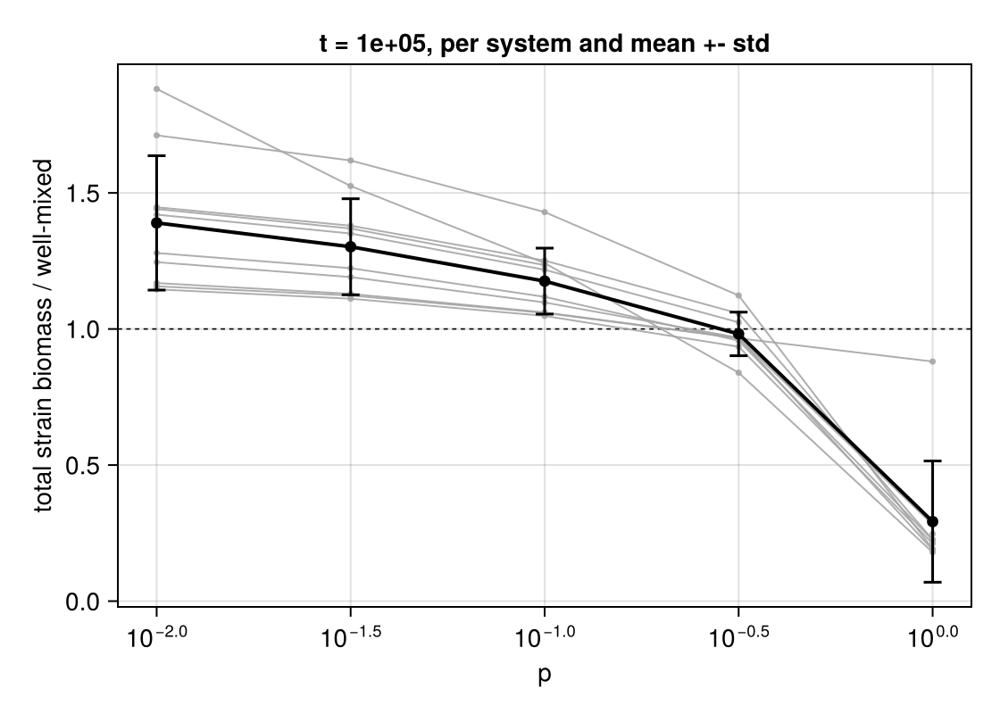

In [40]:
bdf = sort(DataFrame(; df.gdf_row, df.p, biomass_t_at,
        hss=[hss_biom(r) for r in eachrow(df)]), [:gdf_row, :p])
bdf.rel = bdf.biomass_t_at ./ bdf.hss

# mean and std across systems at each p; a run that has not reached t_at is left
# out of its p rather than counted, so n is not the same for every point
stats = combine(groupby(bdf, :p),
    :rel => (v -> mean(skipmissing(v))) => :mean,
    :rel => (v -> std(skipmissing(v))) => :std,
    :rel => (v -> count(!ismissing, v)) => :n)
display(stats)

fig = Figure(; size=(560, 400))
ax = Axis(fig[1, 1]; xscale=log10, xlabel="p",
    ylabel="total strain biomass / well-mixed",
    title=@sprintf("t = %.3g, per system and mean +- std", t_at))
hlines!(ax, 1.0; color=:black, linestyle=:dash, linewidth=0.8)
for sy in sys
    g = bdf[bdf.gdf_row.==sy, :]
    # NaN rather than dropped, so a p that has not reached t_at leaves a gap in
    # the line instead of a segment straight across it
    scatterlines!(ax, g.p, coalesce.(g.rel, NaN);
        color=(:grey65, 0.9), markersize=5, linewidth=1)
end
errorbars!(ax, stats.p, stats.mean, stats.std; color=:black, whiskerwidth=10)
scatterlines!(ax, stats.p, stats.mean; color=:black, markersize=9, linewidth=2)

Makie.save("./figures/relbiomchange_vs_p.pdf", fig)
fig

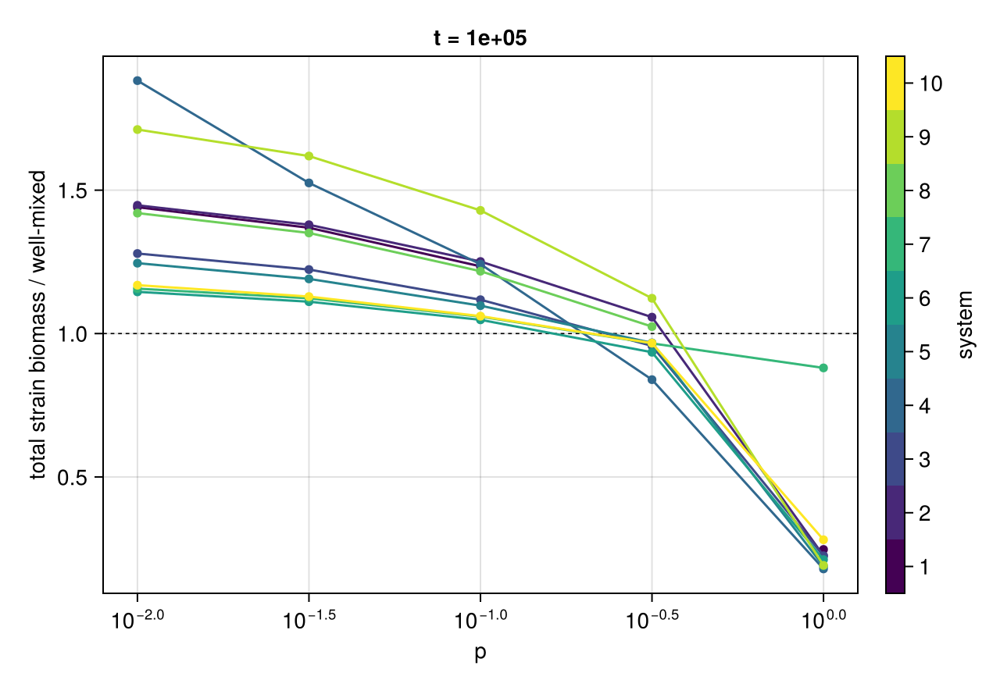

In [38]:
syscolors = Makie.resample_cmap(:viridis, nsys)

fig = Figure(; size=(640, 440))
ax = Axis(fig[1, 1]; xscale=log10, xlabel="p",
    ylabel="total strain biomass / well-mixed",
    title=@sprintf("t = %.3g", t_at))
hlines!(ax, 1.0; color=:black, linestyle=:dash, linewidth=0.8)
for (si, sy) in enumerate(sys)
    g = bdf[bdf.gdf_row.==sy, :]
    # NaN rather than dropped, so a p that has not reached t_at leaves a gap in
    # the line instead of a segment straight across it
    scatterlines!(ax, g.p, coalesce.(g.rel, NaN);
        color=syscolors[si], markersize=8, linewidth=1.5)
end
Colorbar(fig[1, 2]; colormap=cgrad(syscolors; categorical=true),
    colorrange=(0.5, nsys + 0.5), ticks=(1:nsys, string.(sys)), label="system")
fig

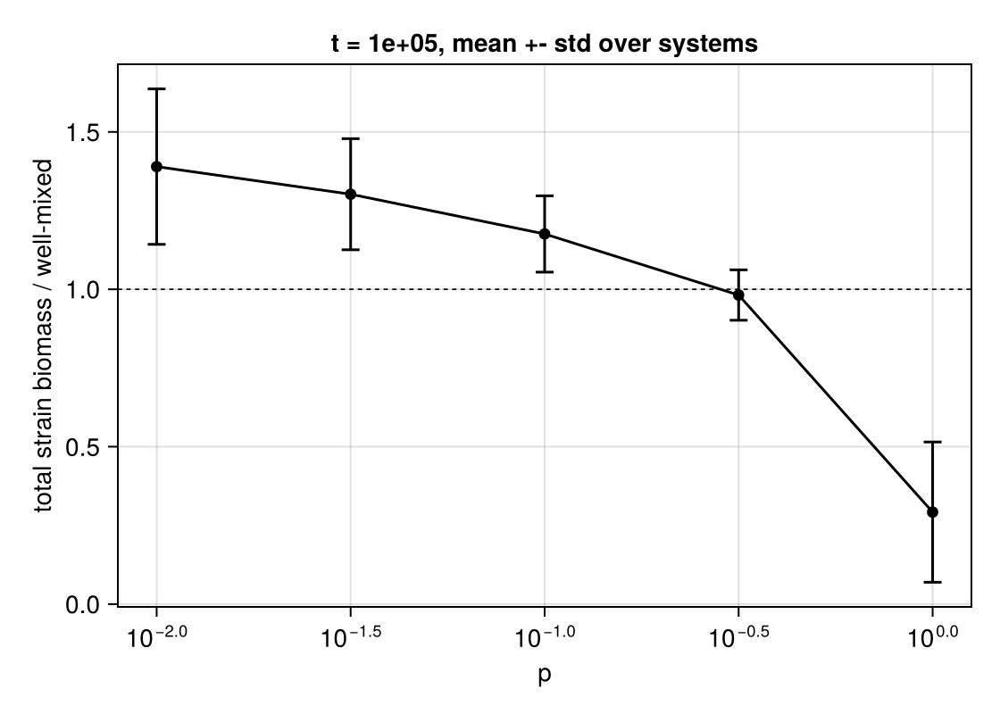

In [39]:
fig = Figure(; size=(560, 400))
ax = Axis(fig[1, 1]; xscale=log10, xlabel="p",
    ylabel="total strain biomass / well-mixed",
    title=@sprintf("t = %.3g, mean +- std over systems", t_at))
hlines!(ax, 1.0; color=:black, linestyle=:dash, linewidth=0.8)
errorbars!(ax, stats.p, stats.mean, stats.std; color=:black, whiskerwidth=10)
scatterlines!(ax, stats.p, stats.mean; color=:black, markersize=9, linewidth=1.5)
fig

## The runs

In [4]:
figdir = "figures"
mkpath(figdir)

halves = [("systems1.jld2", "data1"), ("systems2.jld2", "data2")]

smd = load("systems.jld2", "metadata")
setup_df = load("systems.jld2", "pde_df")

"""
    collect_split_runs(halves)

`collect_pde_runs` over both halves, glued into one dataframe indexed by the row's
position in the unsplit `systems.jld2`. `run_pde_setup` numbered its output files
by position within the half it was handed, so `data1` and `data2` both start at
`row0001` and the plain `pde_df_row` cannot tell them apart; `orig_rows` in each
half is the only way back. The local index is kept as `local_row` alongside the
`outdir` it lives in, since that pair is what `load_pde_states` needs.
"""
function collect_split_runs(halves)
    sort!(vcat(map(halves) do (setup_fname, outdir)
        orig_rows = load(setup_fname, "orig_rows")
        d = collect_pde_runs(outdir)
        d.local_row = d.pde_df_row
        d.pde_df_row = orig_rows[d.local_row]
        d.outdir = fill(outdir, nrow(d))
        d
    end...), :pde_df_row)
end

df = collect_split_runs(halves)
states_of(r) = load_pde_states(r.outdir, r.local_row)

ode_df = load("test1.jld2", "df")  # df_row indexes into this
hss_of(r) = ode_df.final_states[r.df_row]
# Prep_main2_totbiom wrote its ode df into ../main1_test_DN1e-6, where the next
# prep notebook to run would overwrite it; this is a copy taken before that
# happened, so check the systems really do still line up before trusting it.
@assert all(ode_df.params[r.df_row].c == setup_df.params[r.pde_df_row].c for r in eachrow(df))

Ns, Nr = get_Ns(setup_df.params[1])
T = df.T[1]

@printf("%d/%d rows present, missing %s\n", nrow(df), nrow(setup_df),
    string(setdiff(1:nrow(setup_df), df.pde_df_row)))
for rc in sort(unique(string.(df.retcode)))
    @printf("retcode %s: %d\n", rc, count(==(rc), string.(df.retcode)))
end
@printf("reached T = %.3g: %d/%d,  final_T of the rest: %.3g - %.3g\n",
    T, count(==(T), df.final_T), nrow(df),
    minimum(df.final_T[df.final_T.<T]), maximum(df.final_T[df.final_T.<T]))
@printf("saved states per run: %d - %d,  worst residual %.3g\n",
    minimum(df.num_saved), maximum(df.num_saved), maximum(df.maxresid))

select(df, Not(:final_state))

50/50 rows present, missing Int64[]
retcode MaxTime: 15retcode Success: 35
reached T = 1e+08: 35/50,  final_T of the rest: 1.22e+03 - 9.03e+07saved states per run: 9 - 393,  worst residual 0.0326

Row,pde_df_row,gdf_row,df_row,p,L,sN,T,retcode,final_T,maxresid,num_saved,realtime,local_row,outdir
,Int64,Int64,Int64,Float64,Float64,Int64,Float64,T,Float64,Float64,Int64,Float64,Int64,String
1,1,1,33,0.01,123.545,2500,1.0e8,MaxTime,6.40413e5,3.02898e-7,123,36026.8,1,data1
2,2,1,33,0.0316228,123.545,2500,1.0e8,Success,1.0e8,4.81816e-9,22,3378.61,2,data1
3,3,1,33,0.1,123.545,2500,1.0e8,Success,1.0e8,7.92255e-13,31,3927.03,3,data1
4,4,1,33,0.316228,123.545,2500,1.0e8,MaxTime,1215.3,0.0164841,178,36028.2,4,data1
5,5,1,33,1.0,123.545,2500,1.0e8,Success,1.0e8,1.48449e-7,69,19141.2,5,data1
6,6,2,15,0.01,105.997,2500,1.0e8,MaxTime,5.46928e6,5.11231e-10,393,36013.0,6,data1
7,7,2,15,0.0316228,105.997,2500,1.0e8,MaxTime,1.47674e6,4.67679e-10,134,36025.5,7,data1
8,8,2,15,0.1,105.997,2500,1.0e8,MaxTime,4.04157e6,1.25751e-9,390,36016.4,8,data1
9,9,2,15,0.316228,105.997,2500,1.0e8,Success,1.0e8,7.50511e-12,119,14741.6,9,data1


In [5]:
# panel grid: one row per system, one column per p
ps = smd.ps
sys = sort(unique(df.gdf_row))
np, nsys = length(ps), length(sys)
panel_pos(r) = (findfirst(==(r.gdf_row), sys), findfirst(==(r.p), ps))

hss_biom(r) = sum(hss_of(r)[1:Ns])

function short_title(r)
    s = @sprintf("sys %d (df %d), p = %g, L = %.4g", r.gdf_row, r.df_row, r.p, r.L)
    r.retcode == ReturnCode.Success ? s :
    s * @sprintf("\n%s at t = %.3g", string(r.retcode), r.final_T)
end
suptitle = @sprintf("K = %g, l = %g, N = M = %d, DN = %g, DI = %g, sN = %d, T = %.3g",
    smd.K, smd.l, Ns, smd.DN, smd.DI, smd.sN, T)

xs_of(r) = ((1:r.sN) .- 0.5) ./ r.sN   # x / L

# the t window every space-time and biomass panel is drawn over. The solver saves
# a couple of states at t ~ 1e-17, so without a floor here 20 empty decades take
# up most of a log axis. Nothing moves before t ~ 1.
trange = (1e0, T)

"""
    fill_missing_panels!(fig, cells)

Label the grid cells that have no row file, so a gap is never mistaken for a
blank plot.
"""
function fill_missing_panels!(fig, cells)
    for (i, j) in cells
        Label(fig[i, j], "not run"; color=:grey60, tellwidth=false, tellheight=false)
    end
end
missing_cells = [(findfirst(==(setup_df.gdf_row[i]), sys), findfirst(==(setup_df.p[i]), ps))
                 for i in setdiff(1:nrow(setup_df), df.pde_df_row)]

strain_colors = Makie.resample_cmap(ColorSchemes.tab20, Ns)
strain_cmap = cgrad(strain_colors; categorical=true)
strain_crange = (0.5, Ns + 0.5)
suptitle

"K = 10, l = 0.999, N = M = 20, DN = 0.001, DI = 1, sN = 2500, T = 1e+08"

## Diagnostics

In [10]:
gbp = groupby(df, :p);

In [20]:
extrema(df.gdf_row)

(1, 10)

In [76]:
# final_T as a system x p matrix, missing where the row has not run
display(unstack(df, :gdf_row, :p, :final_T))
display(unstack(df, :gdf_row, :p, :retcode))
display(unstack(df, :gdf_row, :p, :num_saved))

Row,gdf_row,0.010000000000000002,0.03162277660168379,0.1,0.31622776601683794,1.0
,Int64,Float64?,Float64?,Float64?,Float64?,Float64?
1,1,6.40413e5,1.0e8,1.0e8,1215.3,1.0e8
2,2,missing,1.47674e6,4.04157e6,missing,3.89843e5
3,3,1.0e8,1.0e8,1.0e8,1.0e8,4.70296e5
4,4,4.70385e5,1.0e8,1.0e8,1.0e8,485712.0
5,5,1.0e8,1.0e8,1.0e8,1.0e8,6.0614e6
6,6,1.04025e7,1.0e8,1.0e8,1.0e8,1.0e8
7,7,1.0e8,1.0e8,1.0e8,1.0e8,1.0e8
8,8,1.0e8,1.0e8,1.0e8,1.0e8,60072.9
9,9,9.02504e7,1.0e8,1.0e8,1.0e8,8.31006e6


Row,gdf_row,0.010000000000000002,0.03162277660168379,0.1,0.31622776601683794,1.0
,Int64,T?,T?,T?,T?,T?
1,1,MaxTime,Success,Success,MaxTime,Success
2,2,missing,MaxTime,MaxTime,missing,MaxTime
3,3,Success,Success,Success,Success,MaxTime
4,4,MaxTime,Success,Success,Success,MaxTime
5,5,Success,Success,Success,Success,MaxTime
6,6,MaxTime,Success,Success,Success,Success
7,7,Success,Success,Success,Success,Success
8,8,Success,Success,Success,Success,MaxTime
9,9,MaxTime,Success,Success,Success,MaxTime


Row,gdf_row,0.010000000000000002,0.03162277660168379,0.1,0.31622776601683794,1.0
,Int64,Int64?,Int64?,Int64?,Int64?,Int64?
1,1,123,22,31,178,69
2,2,missing,134,390,missing,46
3,3,10,10,11,18,44
4,4,125,25,10,16,47
5,5,10,11,14,27,48
6,6,214,34,44,36,67
7,7,10,11,11,14,28
8,8,11,9,11,15,115
9,9,211,17,15,45,124


## Reduced fields

One pass over the saved states (~2GB on disk), keeping only the scalars the plots
need: total strain biomass and locally dominant strain at each gridpoint, and the
spatial mean of each strain.

In [6]:
"""
Cell edges for a heatmap on a log time axis. Makie extrapolates half a cell past
each end, which on these solver time grids lands at or below zero and makes log10
throw; bisecting in log space instead keeps every edge positive.
"""
function log_edges(ts)
    lt = log10.(ts)
    mid = (lt[1:end-1] .+ lt[2:end]) ./ 2
    10 .^ vcat(2 * lt[1] - mid[1], mid, 2 * lt[end] - mid[end])
end

"""
The saved states of `s` inside `trange` as `(; keep, edges)`. The first cell is
stretched back to the start of the window - before it the state is still the
untouched initial condition - but the last edge is pinned to the last saved t
rather than the end of the window, so a run that stopped early stops early on the
plot instead of smearing its final state over the decades it never reached.
"""
function window(s, trange)
    keep = findall(t -> trange[1] <= t <= trange[2], s.ts)
    edges = log_edges(s.ts[keep])
    edges[1] = trange[1]
    edges[end] = s.ts[keep[end]]
    (; keep, edges)
end

series = Dict(map(eachrow(df)) do r
    (; ts, us) = states_of(r)
    keep = findall(>(0.0), ts)   # t = 0 has no place on a log axis
    ts, us = ts[keep], us[keep]
    ntot = permutedims(reduce(hcat, [vec(sum(view(u, 1:Ns, :), dims=1)) for u in us]))
    dom = permutedims(reduce(hcat, [[argmax(view(u, 1:Ns, x)) for x in axes(u, 2)] for u in us]))
    nmean = permutedims(reduce(hcat, [vec(mean(view(u, 1:Ns, :), dims=2)) for u in us]))
    r.pde_df_row => (; ts, ntot, dom, nmean)
end)

# saved states falling inside trange, per run
extrema([length(window(series[r.pde_df_row], trange).keep) for r in eachrow(df)])

(7, 388)

## 1. Space-time, total strain biomass

r.final_T = 1215.3008713877427
r.retcode = SciMLBase.ReturnCode.MaxTime

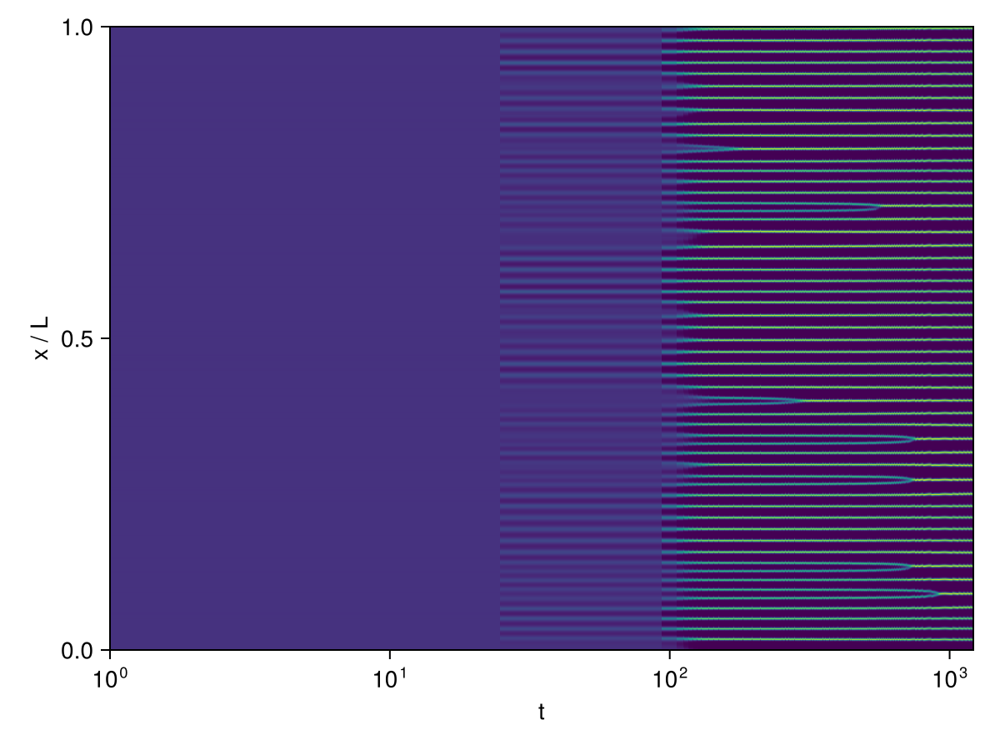

In [79]:
r = df[4,:]
@show r.final_T r.retcode

fig = Figure()
ax = Axis(fig[1,1];
    xscale=log10,
    xlabel="t",
    ylabel="x / L",
)

s = series[r.pde_df_row]
(; keep, edges) = window(s, trange)
hm = heatmap!(ax, edges, xs_of(r), s.ntot[keep, :];
)

display(GLMakie.Screen(), fig)

fig

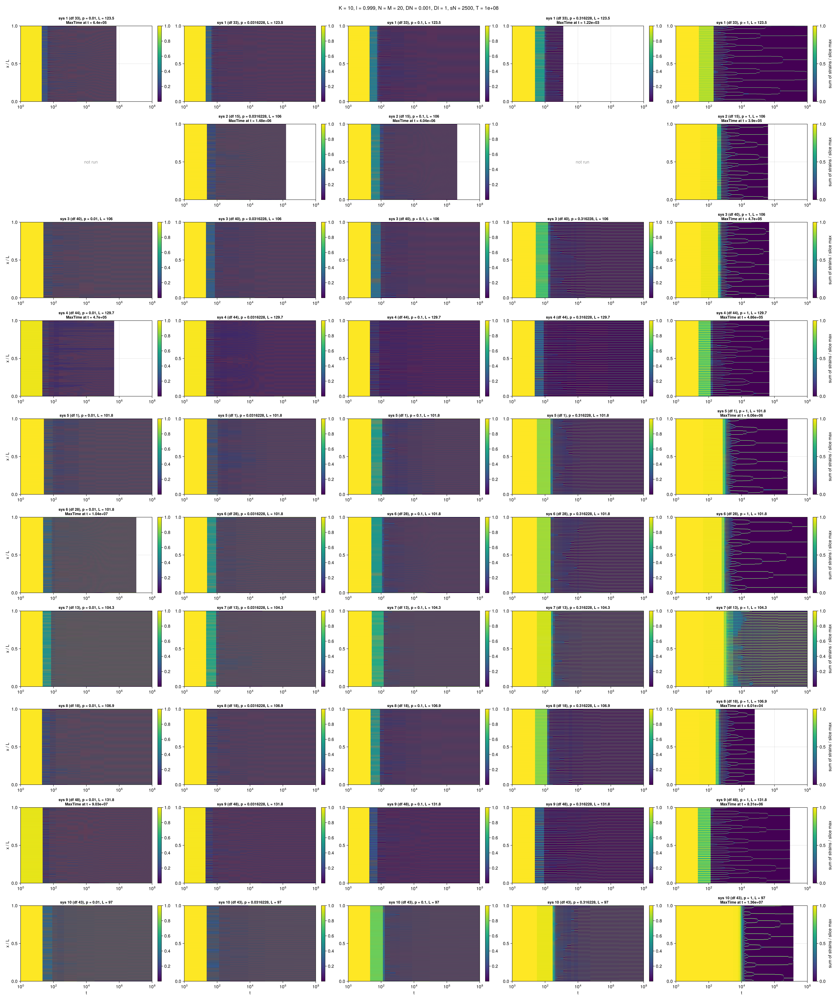

In [7]:
"""
    spacetime_fig(zof, cblabel; colormap, colorrange, ticks)

Space-time heatmap grid, `zof(r, s)` giving the `nt x sN` field for run `r` from
its reduced `series` entry. A `colorrange` is shared by every panel and gets one
colorbar for the whole figure; `nothing` autoscales each panel, which then needs
its own.
"""
function spacetime_fig(zof, cblabel;
    colormap=:viridis, colorrange=nothing, colorscale=identity, ticks=Makie.automatic,
)
    shared = !isnothing(colorrange)
    fig = Figure(; size=((shared ? 460 : 520) * np + 80, 320 * nsys))
    Label(fig[0, 1:np], suptitle; fontsize=16, tellwidth=false)
    last_hm = nothing

    for r in eachrow(df)
        i, j = panel_pos(r)
        gl = GridLayout(fig[i, j])
        ax = Axis(gl[1, 1]; xscale=log10, title=short_title(r), titlesize=12,
            xlabel=(i == nsys ? "t" : ""), ylabel=(j == 1 ? "x / L" : ""))

        s = series[r.pde_df_row]
        (; keep, edges) = window(s, trange)
        hm = heatmap!(ax, edges, xs_of(r), zof(r, s)[keep, :];
            colormap, colorscale, rasterize=2,
            colorrange=something(colorrange, Makie.automatic))
        last_hm = hm
        shared || Colorbar(gl[1, 2], hm; label=(j == np ? cblabel : ""), ticks)
        xlims!(ax, trange...)
    end
    fill_missing_panels!(fig, missing_cells)
    # off the heatmap itself rather than by attribute, so the colorbar cannot
    # disagree with the panels about the scale
    shared && Colorbar(fig[1:nsys, np+1], last_hm; ticks, label=cblabel)
    rowgap!(fig.layout, 16)
    fig
end

# Each time slice divided by its own maximum. The spikes reach tens of times the
# homogeneous background, so on a raw scale the whole emergence phase is one flat
# colour; per-slice normalisation shows the pattern's shape at every stage and
# says nothing about amplitude.
fig = spacetime_fig((r, s) -> s.ntot ./ maximum(s.ntot; dims=2),
    "sum of strains / slice max")
Makie.save(joinpath(figdir, "spacetime_biomass.pdf"), fig)
fig

## 2. Space-time, total strain biomass over the well-mixed total

The systems' well-mixed total biomasses differ by a factor of ~2, so dividing each
run by its own puts every panel on the one colour scale below.

In [ ]:
# a log colour scale: the peaks run to ~10x the well-mixed total while the troughs
# go to zero, which on a linear scale leaves everything but the peaks one flat
# colour. Values are clamped at `hssnorm_lo` so the empty troughs stay on scale.
hssnorm_lo = 1e-2
hssnorm_max = maximum(maximum(series[r.pde_df_row].ntot) / hss_biom(r) for r in eachrow(df))
fig = spacetime_fig((r, s) -> max.(s.ntot ./ hss_biom(r), hssnorm_lo),
    "sum of strains / well-mixed total";
    colorrange=(hssnorm_lo, hssnorm_max), colorscale=log10)
Makie.save(joinpath(figdir, "spacetime_biomass_hss.pdf"), fig)
fig

## 3. Space-time, locally dominant strain

`argmax` over the strains at each gridpoint, tab20 so each of the 20 strains keeps
one colour. Says nothing about amplitude.

In [ ]:
fig = spacetime_fig((r, s) -> s.dom, "strain";
    colormap=strain_cmap, colorrange=strain_crange, ticks=1:Ns)
Makie.save(joinpath(figdir, "spacetime_dominant.pdf"), fig)
fig

## 4. Final states

Strains on top, resources below, dashed lines the well-mixed steady state.

In [ ]:
"""
    final_states_fig(; xfrac)

Final state of every run. `xfrac` plots only the first that fraction of the
domain, for zooming in far enough to see individual peaks - the gridpoints
outside it are dropped rather than clipped, which is also what keeps the pdf
small.
"""
function final_states_fig(; xfrac=1.0)
    fig = Figure(; size=(520 * np, 400 * nsys))
    Label(fig[0, 1:np], suptitle; fontsize=16, tellwidth=false)
    for r in eachrow(df)
        i, j = panel_pos(r)
        nsub = round(Int, xfrac * r.sN)
        axs, axr = plot_spatial_fs!(fig[i, j], r.final_state[:, 1:nsub], Ns, nsub,
            r.L / r.sN, hss_of(r))
        axs.title = short_title(r)
        axs.titlesize = 12
        axr.xlabel = (i == nsys ? "x" : "")
        if j == 1
            axs.ylabel = "strains"
            axr.ylabel = "resources"
        end
    end
    fill_missing_panels!(fig, missing_cells)
    rowgap!(fig.layout, 16)
    fig
end

fig = final_states_fig()
Makie.save(joinpath(figdir, "final_states.pdf"), fig)
fig

## 5. Final states, first tenth of the domain

L was sized to fit 100 peaks at the smallest p, so a tenth of it is 10 peaks
there and fewer at the larger ps.

In [ ]:
fig = final_states_fig(; xfrac=0.1)
Makie.save(joinpath(figdir, "final_states_zoom.pdf"), fig)
fig

## 6. Spatial mean biomass in time

Spatial mean of each strain, their sum in black, dashed lines the well-mixed
steady state of the same quantity. Mean rather than total since the domains differ
in size. y is linked across a system's ps.

In [ ]:
"""
    biomass_time_fig(; yscale, floor)

The spatial mean biomass panel grid. On a log axis the values are clamped at
`floor` so the extinct strains stay on the plot.
"""
function biomass_time_fig(; yscale=identity, floor=1e-8)
    clamp_y(v) = yscale === log10 ? max.(v, floor) : v

    fig = Figure(; size=(480 * np + 80, 340 * nsys))
    Label(fig[0, 1:np], suptitle; fontsize=16, tellwidth=false)
    axgrid = Matrix{Any}(nothing, nsys, np)

    for r in eachrow(df)
        i, j = panel_pos(r)
        ax = Axis(fig[i, j]; xscale=log10, yscale, title=short_title(r), titlesize=12,
            xlabel=(i == nsys ? "t" : ""),
            ylabel=(j == 1 ? "spatial mean biomass" : ""))
        axgrid[i, j] = ax

        s = series[r.pde_df_row]
        hss = hss_of(r)
        for n in 1:Ns
            hlines!(ax, clamp_y(hss[n]); color=strain_colors[n], linestyle=:dash, linewidth=0.7)
            lines!(ax, s.ts, clamp_y(view(s.nmean, :, n)); color=strain_colors[n], linewidth=1.2)
        end
        hlines!(ax, clamp_y(sum(hss[1:Ns])); color=:black, linestyle=:dash, linewidth=1.2)
        lines!(ax, s.ts, clamp_y(vec(sum(s.nmean; dims=2))); color=:black, linewidth=2)

        xlims!(ax, trange...)
    end
    fill_missing_panels!(fig, missing_cells)
    for i in 1:nsys
        linkyaxes!(filter(!isnothing, axgrid[i, :])...)
    end
    Colorbar(fig[1:nsys, np+1]; colormap=strain_cmap, colorrange=strain_crange,
        label="strain", ticks=1:Ns)
    rowgap!(fig.layout, 16)
    fig
end

fig = biomass_time_fig()
Makie.save(joinpath(figdir, "biomass_in_time.pdf"), fig)
fig

## 7. The same on a log y axis

Shows the strains invading from the perturbation, which the linear axis flattens
onto zero.

In [ ]:
fig = biomass_time_fig(; yscale=log10, floor=1e-8)
Makie.save(joinpath(figdir, "biomass_in_time_log.pdf"), fig)
fig

## 8. Total biomass over the well-mixed total

One panel per system, one line per p - the version that puts systems with
different steady states on the same axis.

In [ ]:
pcolors = Makie.resample_cmap(:viridis, np)
ncols = 5
nrows = cld(nsys, ncols)

fig = Figure(; size=(420 * ncols + 80, 320 * nrows))
Label(fig[0, 1:ncols], suptitle; fontsize=16, tellwidth=false)
for (si, sy) in enumerate(sys)
    i, j = fldmod1(si, ncols)
    r0 = df[findfirst(==(sy), df.gdf_row), :]
    ax = Axis(fig[i, j]; xscale=log10, titlesize=12,
        title=@sprintf("sys %d (df %d), well-mixed total = %.4g", sy, r0.df_row, hss_biom(r0)),
        xlabel=(i == nrows ? "t" : ""),
        ylabel=(j == 1 ? "total strain biomass / well-mixed" : ""))
    hlines!(ax, 1.0; color=:black, linestyle=:dash, linewidth=0.8)
    for r in eachrow(df[df.gdf_row.==sy, :])
        s = series[r.pde_df_row]
        lines!(ax, s.ts, vec(sum(s.nmean; dims=2)) ./ hss_biom(r);
            color=pcolors[findfirst(==(r.p), ps)], linewidth=1.5)
    end
    xlims!(ax, trange...)
end
Colorbar(fig[1:nrows, ncols+1]; colormap=cgrad(pcolors; categorical=true),
    colorrange=(0.5, np + 0.5), ticks=(1:np, [@sprintf("%.3g", p) for p in ps]), label="p")
Makie.save(joinpath(figdir, "biomass_in_time_rel.pdf"), fig)
fig

## 9. Final vs well-mixed abundances

Spatial mean of the PDE final state against the well-mixed steady state, per
strain and per resource. Dashed line is y = x.

In [ ]:
fig = Figure(; size=(400 * np, 400 * nsys))
Label(fig[0, 1:np], suptitle; fontsize=16, tellwidth=false)
for r in eachrow(df)
    i, j = panel_pos(r)
    hss = hss_of(r)
    mns = vec(mean(r.final_state, dims=2))

    ax = Axis(fig[i, j]; title=short_title(r), titlesize=12, aspect=1,
        xlabel=(i == nsys ? "well-mixed steady state" : ""),
        ylabel=(j == 1 ? "PDE spatial mean" : ""))
    ablines!(ax, 0.0, 1.0; color=:black, linestyle=:dash, linewidth=1)
    scatter!(ax, hss[1:Ns], mns[1:Ns]; color=:steelblue, markersize=9, label="strains")
    scatter!(ax, hss[Ns+1:end], mns[Ns+1:end];
        color=:firebrick, marker=:diamond, markersize=9, label="resources")
    (i == 1 && j == 1) && axislegend(ax; position=:lt, framevisible=true)

    hi = 1.05 * max(maximum(hss), maximum(mns))
    limits!(ax, -0.02hi, hi, -0.02hi, hi)
end
fill_missing_panels!(fig, missing_cells)
rowgap!(fig.layout, 16)
Makie.save(joinpath(figdir, "final_vs_hom.pdf"), fig)
fig

## Summary

In [ ]:
summary_df = DataFrame(map(eachrow(df)) do r
    hss = hss_of(r)
    mns = vec(mean(r.final_state, dims=2))
    (; r.pde_df_row, sys=r.gdf_row, r.df_row, r.p, retcode=string(r.retcode), r.final_T,
        hom_biomass=sum(hss[1:Ns]),
        pde_biomass=sum(mns[1:Ns]),
        biomass_ratio=sum(mns[1:Ns]) / sum(hss[1:Ns]),
        hom_surv=count(>(1e-6), hss[1:Ns]),
        pde_surv=count(>(1e-6), mns[1:Ns]))
end)